In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from keras.applications import ResNet50, MobileNetV2, EfficientNetB0

import platform
import os
import random
import shutil
import tqdm
import albumentations as A
import cv2

In [3]:
print(f"Python : {platform.python_version()}")
print(f"Tensorflow : {tf.__version__}")
print(f"Keras : {keras.__version__}")
print(f"Device List : {tf.config.list_physical_devices('GPU')}")

Python : 3.11.13
Tensorflow : 2.18.0
Keras : 3.8.0
Device List : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [4]:
!nvidia-smi

Wed Nov 19 14:19:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8             11W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sujaykapadnis/pomegranate-fruit-diseases-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/pomegranate-fruit-diseases-dataset


In [6]:
BASE_DIR = "/kaggle/input/pomegranate-fruit-diseases-dataset/Pomegranate Fruit Diseases Dataset for Deep Learning Models/Pomegranate Diseases Dataset/Pomegranate Diseases Dataset"

In [7]:
# This path URL is so Damn Big, let't get rid of it
ALIAS_PATH = "/kaggle/working/pomegranate_dataset"

if not os.path.exists(ALIAS_PATH):
    os.symlink(BASE_DIR, ALIAS_PATH)
    print(f"Created Alias at: '{ALIAS_PATH}'")
else:
    print(f"Alias already exists at {ALIAS_PATH}")

Alias already exists at /kaggle/working/pomegranate_dataset


In [8]:
class DataSetManager:
    def __init__(self, BASE_DIR):
        self.BASE_DIR = BASE_DIR
        self.img_extensions = ['.jpg', '.jpeg', '.png', '.bmp', 'tiff']

    def analyze_distribution(self):
        """
        Counts and prints the number of images in each folder.
        """
        if not os.path.exists(self.BASE_DIR):
            print(f"Error: Directory {self.BASE_DIR} not found.")
            return

        counts = {}
        print(f"\n--- Dataset Distribution in '{self.BASE_DIR}' ---")

        for folder in os.listdir(self.BASE_DIR):
            folder_path = os.path.join(self.BASE_DIR, folder)

            if os.path.isdir(folder_path):
                valid_files = [
                    f for f in os.listdir(folder_path)
                    if os.path.splitext(f)[1].lower() in self.img_extensions
                ]
                counts[folder] = len(valid_files)

                print(f"{folder:<20} : {len(valid_files):>5} images")

        return counts

    def split_dataset(self, OUTPUT_DIR = "/kaggle/working/dataset_split", train_ratio=0.8):
        """
        Splits the Dataset into Train and Test folders
        Args :
            OUTPUT_ROOT : Where to create the split folders (Default : 'dataset_split')
            train_ratio : Percentage of images for training (Default : 0.8)
        """
        self.TRAIN_DIR = os.path.join(OUTPUT_DIR, "train")
        self.TEST_DIR = os.path.join(OUTPUT_DIR, "test")

        os.makedirs(self.TRAIN_DIR, exist_ok = True)
        os.makedirs(self.TEST_DIR, exist_ok = True)

        print(f"\n--- Splitting Dataset (Train Ratio: {train_ratio}) ---")

        for class_name in os.listdir(self.BASE_DIR):
            class_path = os.path.join(self.BASE_DIR, class_name)

            if not os.path.isdir(class_path):
                continue

            os.makedirs(os.path.join(self.TRAIN_DIR, class_name), exist_ok = True)
            os.makedirs(os.path.join(self.TEST_DIR, class_name), exist_ok = True)

            images = [
                f for f in os.listdir(class_path)
                if os.path.splitext(f)[1].lower() in self.img_extensions
            ]

            random.shuffle(images)

            split_index = int(train_ratio * len(images))

            train_imgs = images[ : split_index]
            test_imgs = images[split_index : ]

            for img in train_imgs:
                shutil.copy(
                    os.path.join(class_path, img),
                    os.path.join(self.TRAIN_DIR, class_name, img)
                )

            for img in test_imgs:
                shutil.copy(
                    os.path.join(class_path, img),
                    os.path.join(self.TEST_DIR, class_name, img)
                )

            print(f"{class_name:<20} : {len(train_imgs):>4} Train | {len(test_imgs):>4} Test")

        print(f"\nSplit completed. Saved to: {OUTPUT_DIR}")

    def augment_data(self, TARGET_DIR = None, aug_per_image = 1):
        """
        Applies augmentation to images in the target directory
        Args :
            TARGET_DIR: Folder to augment (defaults to self.TRAIN_DIR)
            aug_per_image: How many new images to create per original image.
        """
        if TARGET_DIR is None:
            if hasattr(self, 'TRAIN_DIR'):
                TARGET_DIR = self.TRAIN_DIR
            else:
                print("Error : Please run split_dataset() first or provide a target_dir.")
                return

        pipeline = A.Compose(
            [
                A.Rotate(limit=20, p=0.7),
                A.HorizontalFlip(p=0.5),
                A.RandomBrightnessContrast(p=0.3),
                A.RandomGamma(p=0.3),
            ]
        )

        print(f"\n--- Starting Augmentation (x{aug_per_image} per image) ---")
        print(f"Target : {TARGET_DIR}")

        for class_name in os.listdir(TARGET_DIR):
            class_path = os.path.join(TARGET_DIR, class_name)

            if not os.path.isdir(class_path):
                continue

            print(f"Processing Class : {class_name}")

            for img_name in tqdm.tqdm(os.listdir(class_path)):
                if img_name.startswith("aug_"):
                    continue

                img_path = os.path.join(class_path, img_name)

                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                for i in range(aug_per_image):
                    augmented = pipeline(image=image)["image"]
                    save_path = os.path.join(class_path, f"aug_{i}_{img_name}")
                    cv2.imwrite(save_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

        print("\nAugmentation completed.")

In [9]:
shutil.rmtree("/kaggle/working/dataset_split", ignore_errors=True)
print("Old split folder deleted!")

Old split folder deleted!


In [10]:
manager : DataSetManager = DataSetManager(BASE_DIR = ALIAS_PATH)
_ = manager.analyze_distribution()


--- Dataset Distribution in '/kaggle/working/pomegranate_dataset' ---
Cercospora           :   631 images
Anthracnose          :  1166 images
Alternaria           :   886 images
Healthy              :  1450 images
Bacterial_Blight     :   966 images


In [11]:
manager.split_dataset(OUTPUT_DIR = "/kaggle/working/dataset_split", train_ratio = 0.8)


--- Splitting Dataset (Train Ratio: 0.8) ---
Cercospora           :  504 Train |  127 Test
Anthracnose          :  932 Train |  234 Test
Alternaria           :  708 Train |  178 Test
Healthy              : 1160 Train |  290 Test
Bacterial_Blight     :  772 Train |  194 Test

Split completed. Saved to: /kaggle/working/dataset_split


In [12]:
manager.augment_data(aug_per_image = 1)


--- Starting Augmentation (x1 per image) ---
Target : /kaggle/working/dataset_split/train
Processing Class : Cercospora


100%|██████████| 504/504 [01:10<00:00,  7.11it/s]


Processing Class : Alternaria


100%|██████████| 708/708 [01:43<00:00,  6.86it/s]


Processing Class : Bacterial_Blight


100%|██████████| 772/772 [01:49<00:00,  7.03it/s]


Processing Class : Healthy


100%|██████████| 1160/1160 [02:45<00:00,  7.03it/s]


Processing Class : Anthracnose


100%|██████████| 932/932 [02:13<00:00,  6.99it/s]


Augmentation completed.


In [16]:
class DataVisualizer:
        def __init__(self, class_names=None):
            self.class_names = class_names
            print('DataVisualizer Initialized. Ready to plot.')

        def display_samples(self, dataset, num_images = 25):
            """
            Displays a batch of images from the dataset to visualize the data.

            Args:
                dataset: A tf.data.Dataset object (e.g., train_ds)
                num_images: The maximum number of images to display in the grid (e.g., 25 for a 5x5 grid).
            """
            for images, labels in dataset.take(1):
                break

            class_names = self.class_names

            plt.figure(figsize = (12, 12))

            grid_size = int(np.ceil(np.sqrt(num_images)))

            print(f"Displaying the first {min(num_images, len(images))} images from one batch:")

            for i in range(min(num_images, len(images))):
                ax = plt.subplot(grid_size, grid_size, i + 1)

                plt.imshow(images[i].numpy().astype("uint8"))

                true_label = class_names[int(labels[i].numpy())]
                
                plt.title(true_label, fontsize = 10, color = 'lime')
                plt.axis("off")

            plt.tight_layout()
            plt.show()

        def display_5_per_class(self, BASE_DIR, img_size = (224, 224)):
            """
            Displays exactly 5 images per class from the given directory.
            Total = 25 images if 5 classes exist.
            """
            classes = sorted(os.listdir(BASE_DIR))
            plt.figure(figsize=(12, 12))

            img_index = 1

            for cls in classes:
                class_path = os.path.join(BASE_DIR, cls)

                images = [
                    f for f in os.listdir(class_path)
                    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
                ]

                images = images[:5]

                print(f"Showing 5 images from class: {cls}")

                for img_name in images:
                    img_path = os.path.join(class_path, img_name)
                    img = cv2.imread(img_path)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, img_size)

                    ax = plt.subplot(5, 5, img_index)
                    plt.imshow(img)
                    plt.title(cls, fontsize = 10, color = 'lime')
                    plt.axis("off")

                    img_index += 1

            plt.tight_layout()
            plt.show()

In [17]:
class DatasetLoader:
    def __init__(self, IMAGE_SIZE = (224, 224), BATCH_SIZE = 32):
        self.IMAGE_SIZE = IMAGE_SIZE
        self.BATCH_SIZE = BATCH_SIZE
        print("DatasetLoader Initialized")

    def load(self, train_dir, test_dir):
        """
        Loads train and test datasets using tf.data API.
        Returns: train_ds, test_ds, class_names
        """
        train_ds = keras.utils.image_dataset_from_directory(
            directory=train_dir,
            image_size=self.IMAGE_SIZE,
            batch_size=self.BATCH_SIZE,
            shuffle=True,
            label_mode="int",
            color_mode="rgb"
        )

        test_ds = keras.utils.image_dataset_from_directory(
            directory=test_dir,
            image_size=self.IMAGE_SIZE,
            batch_size=self.BATCH_SIZE,
            shuffle=True,
            label_mode="int",
            color_mode="rgb"
        )

        print("Datasets loaded successfully!")
        print("Classes:", train_ds.class_names)

        self.train_ds = train_ds
        self.test_ds = test_ds
        self.class_names = train_ds.class_names

        return self.train_ds, self.test_ds, self.train_ds.class_names

    def prepare(self):
        """
        Applies cache, shuffle, prefetch optimizations.
        Returns optimized datasets.
        """
        AUTOTUNE = tf.data.AUTOTUNE

        print("Applying cache, shuffle, and prefetch optimizations...")

        self.train_ds = (
            self.train_ds
            .cache()
            .shuffle(1000)
            .prefetch(buffer_size=AUTOTUNE)
        )

        self.test_ds = (
            self.test_ds
            .cache()
            .prefetch(buffer_size=AUTOTUNE)
        )

        print("Datasets optimized!")
        return self.train_ds, self.test_ds

In [18]:
plt.style.use('dark_background')

In [19]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [20]:
loader = DatasetLoader(IMAGE_SIZE=IMAGE_SIZE, BATCH_SIZE=BATCH_SIZE)

train_ds, test_ds, class_names = loader.load(
    train_dir="/kaggle/working/dataset_split/train",
    test_dir="/kaggle/working/dataset_split/test"
)

DatasetLoader Initialized
Found 8152 files belonging to 5 classes.


I0000 00:00:1763563473.630725     252 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1763563473.632608     252 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 1023 files belonging to 5 classes.
Datasets loaded successfully!
Classes: ['Alternaria', 'Anthracnose', 'Bacterial_Blight', 'Cercospora', 'Healthy']


In [21]:
train_ds, test_ds = loader.prepare()

Applying cache, shuffle, and prefetch optimizations...
Datasets optimized!


In [22]:
viz = DataVisualizer(class_names=class_names)

DataVisualizer Initialized. Ready to plot.


Showing 5 images from class: Alternaria
Showing 5 images from class: Anthracnose
Showing 5 images from class: Bacterial_Blight
Showing 5 images from class: Cercospora
Showing 5 images from class: Healthy


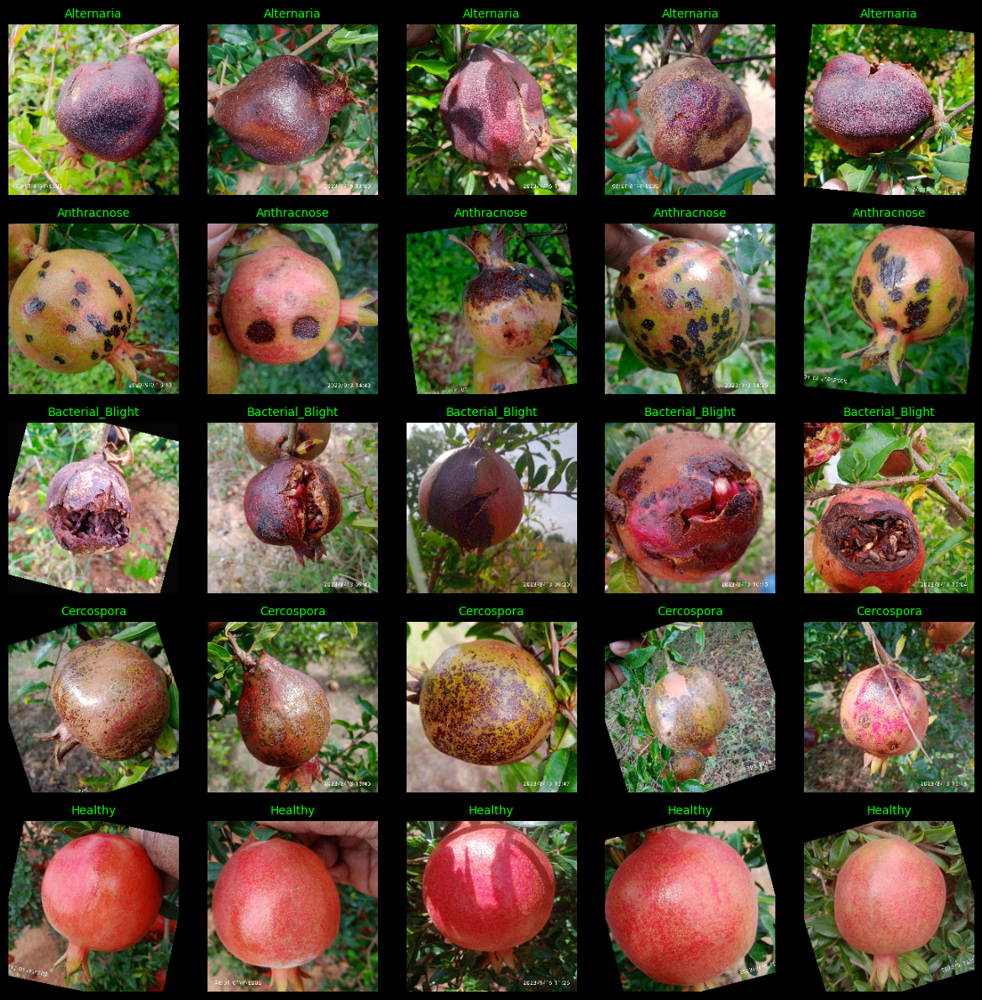

In [23]:
viz.display_5_per_class("/kaggle/working/dataset_split/train")

Showing 5 images from class: Alternaria
Showing 5 images from class: Anthracnose
Showing 5 images from class: Bacterial_Blight
Showing 5 images from class: Cercospora
Showing 5 images from class: Healthy


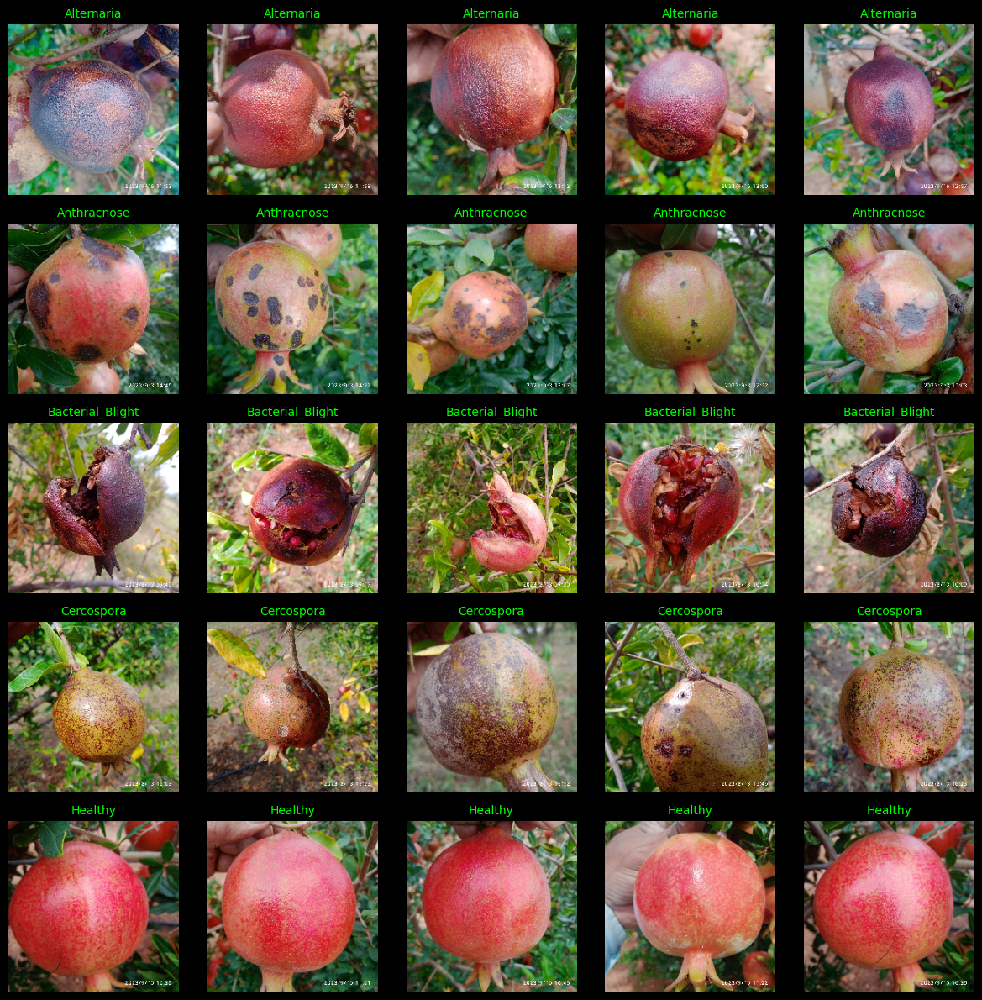

In [24]:
viz.display_5_per_class("/kaggle/working/dataset_split/test")

Displaying the first 25 images from one batch:


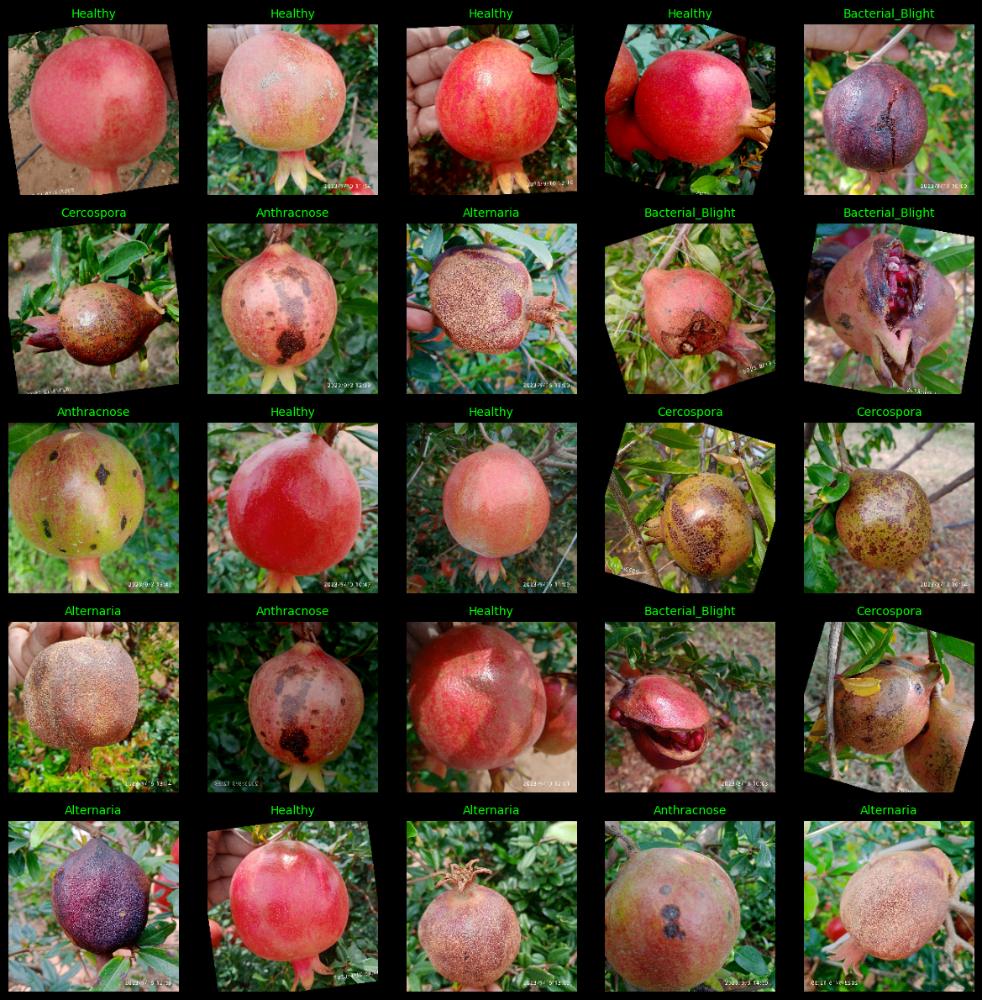

In [25]:
viz.display_samples(train_ds)

In [85]:
class ModelBuilder:
    def __init__(self, image_size = (224, 224), num_classes = 5):
        self.image_size = image_size
        self.num_classes = num_classes
        print("ModelBuilder Initialized")

    def build_efficientnetb0(self):
        """
        Builds a transfer-learning model using EfficientNetB0.
        Returns: compiled Keras model
        """
        base_model = EfficientNetB0(
            weights="imagenet",
            include_top=False,
            input_shape=(*self.image_size, 3)
        )

        base_model.trainable = False

        model = keras.models.Sequential(
            [
                keras.layers.Input(shape=(*self.image_size, 3)),

                base_model,

                keras.layers.GlobalAveragePooling2D(),
                keras.layers.Dense(256, activation='relu'),
                keras.layers.Dropout(0.3),
                keras.layers.Dense(128, activation='relu'),
                keras.layers.Dropout(0.3),
                keras.layers.Dense(self.num_classes, activation='softmax')
            ]
        )

        print("EfficientNetB0 model built successfully")
        self.model = model
        
        return self.model

In [86]:
builder = ModelBuilder(
    image_size = IMAGE_SIZE,
    num_classes = len(class_names)
)

model = builder.build_efficientnetb0()

ModelBuilder Initialized
EfficientNetB0 model built successfully


In [87]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,411,048 (16.83 MB)

 Trainable params: 361,477 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

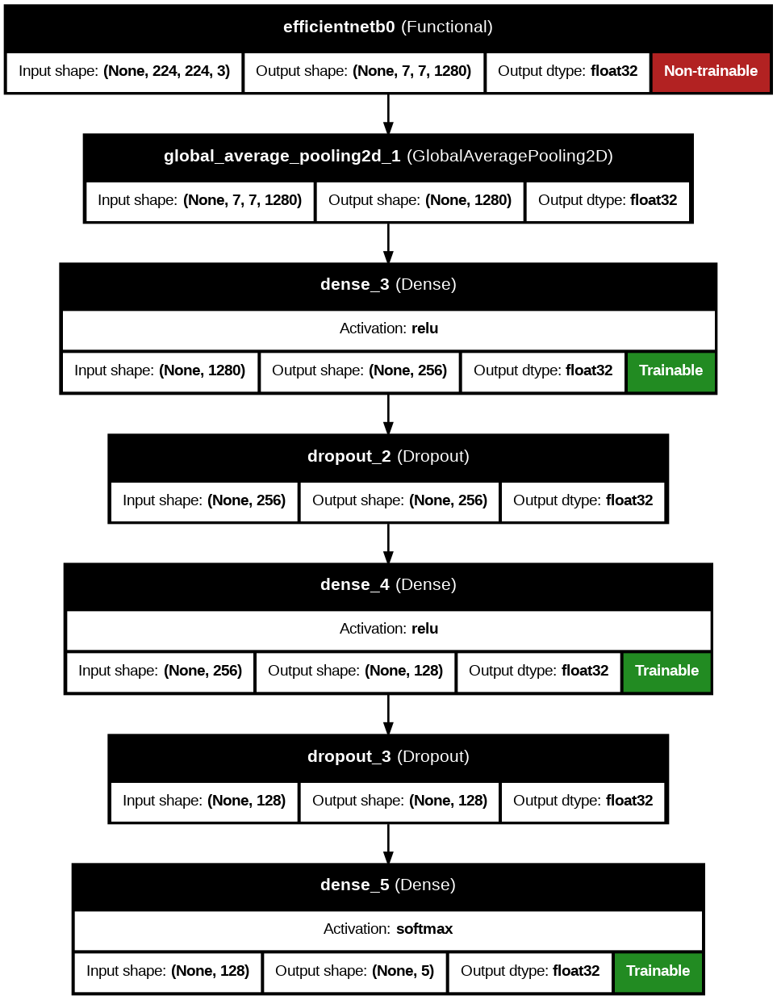

In [88]:
keras.utils.plot_model(
    model,
    to_file = 'Model.png',
    show_shapes = True,
    show_dtype = True,
    show_layer_names = True,
    rankdir = 'TB',
    expand_nested = False,
    dpi = 96,
    show_layer_activations = True,
    show_trainable = True,
)

In [89]:
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate = 0.0005),
    loss = "sparse_categorical_crossentropy",
    metrics = ['accuracy']
)

In [90]:
callbacks = [
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True
    ),

    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=4,
        min_lr=1e-6
    ),

    keras.callbacks.ModelCheckpoint(
        filepath="/kaggle/working/best_model.keras",
        monitor="val_accuracy",
        save_best_only=True
    )
]

In [91]:
history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs = 20,
    callbacks = callbacks,
)

Epoch 1/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 47s 109ms/step - accuracy: 0.8335 - loss: 0.4786 - val_accuracy: 0.9775 - val_loss: 0.0675 - learning_rate: 5.0000e-04
Epoch 2/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.9755 - loss: 0.0748 - val_accuracy: 0.9785 - val_loss: 0.0592 - learning_rate: 5.0000e-04
Epoch 3/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.9840 - loss: 0.0537 - val_accuracy: 0.9844 - val_loss: 0.0536 - learning_rate: 5.0000e-04
Epoch 4/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - accuracy: 0.9890 - loss: 0.0349 - val_accuracy: 0.9795 - val_loss: 0.0588 - learning_rate: 5.0000e-04
Epoch 5/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - accuracy: 0.9920 - loss: 0.0262 - val_accuracy: 0.9834 - val_loss: 0.0515 - learning_rate: 5.0000e-04
Epoch 6/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.9917 - loss: 0.0269 - val_accuracy: 0.9853 - val_loss: 0.0485 - learning_rate: 5.0000e-04
Epoch 7/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - a

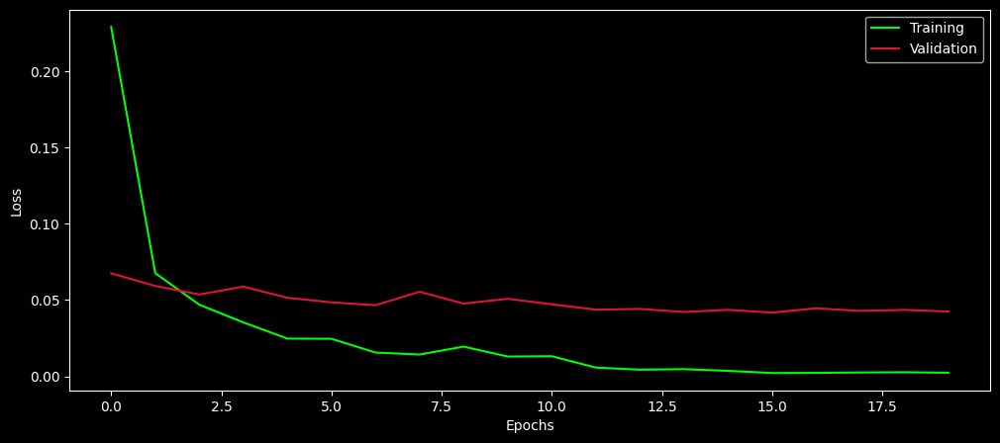

In [92]:
plt.style.use("dark_background")

plt.figure(figsize = (12,5))

plt.plot(history.history['loss'], color = "lime", label = "Training")
plt.plot(history.history['val_loss'], color = "crimson", label = 'Validation')
plt.xlabel("Epochs")
plt.ylabel('Loss')

plt.legend()

plt.show()

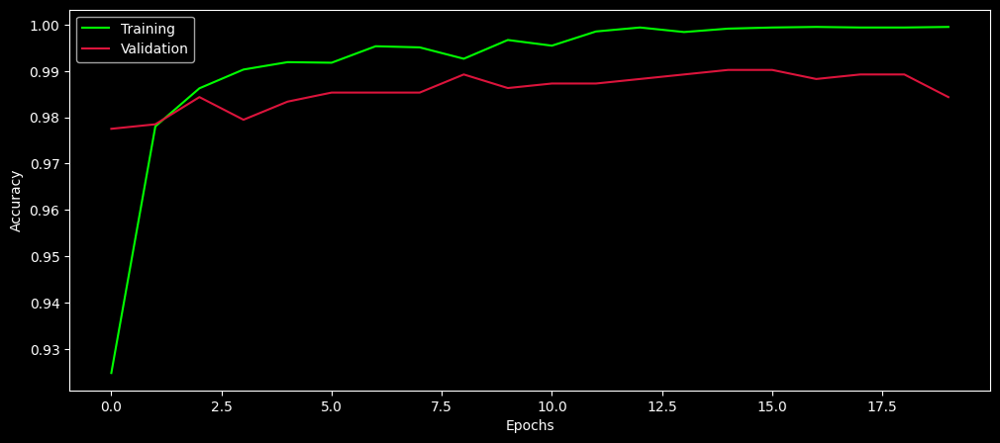

In [93]:
plt.figure(figsize = (12,5))

plt.plot(history.history['accuracy'], color = "lime", label = "Training")
plt.plot(history.history['val_accuracy'], color = "crimson", label = 'Validation')
plt.xlabel("Epochs")
plt.ylabel('Accuracy')

plt.legend()

plt.show()

In [94]:
model.save("Best_Model.keras")

In [95]:
import tensorflow as tf
from tensorflow import keras

tf.keras.config.enable_unsafe_deserialization()

best_model = keras.models.load_model("/kaggle/working/best_model.keras")
best_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,134,004 (19.58 MB)

 Trainable params: 361,477 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

 Optimizer params: 722,956 (2.76 MB)

In [96]:
import urllib.request

In [97]:
def resize_and_predict(image_paths, model, class_names, image_size=(224, 224)):
    """
    Batch prediction function supporting both local image paths and URLs.
    
    Args:
        image_paths (list):
            List of image file paths or URLs.
            Example: ["/kaggle/working/img1.jpg", "https://example.com/img.jpg"]
    
        model:
            Trained Keras model used for inference.
    
        class_names (list):
            List of class labels in training order.
    
        image_size (tuple):
            Target size for resizing images (default: (224, 224)).
    
    Returns:
        List of (predicted_label, confidence_percentage) for each image.
    """

    preprocessed_images = []

    for path in image_paths:

        if str(path).startswith("http://") or str(path).startswith("https://"):
            tmp_path = "/kaggle/working/temp_img.jpg"
            urllib.request.urlretrieve(path, tmp_path)
            img_path = tmp_path
        else:
            img_path = path

        img = cv2.imread(img_path)
        if img is None:
            print(f"Cannot read: {path}")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img = cv2.resize(img, image_size)

        img = img.astype(np.float32)

        img = tf.keras.applications.efficientnet.preprocess_input(img)

        preprocessed_images.append(img)

    if len(preprocessed_images) == 0:
        raise ValueError("No valid image found in list.")

    batch = np.stack(preprocessed_images, axis=0)

    preds = model.predict(batch)

    results = []
    for i in range(len(preds)):
        idx = np.argmax(preds[i])
        label = class_names[idx]
        confidence = preds[i][idx] * 100
        results.append((label, confidence))

    return results

In [114]:
image_paths = [
    "https://i.pinimg.com/1200x/03/d4/eb/03d4ebafd87784623531c388f648b09a.jpg",
    "https://gardenerspath.com/wp-content/uploads/2021/10/Pomegranate-Eaten-By-a-Squirrel.jpg",
    "https://content.peat-cloud.com/w400/anthracnose-of-pomegranate-pomegranate-1665753930.jpg",
    # "https://plantclinic.tamu.edu/wp-content/uploads/2018/12/Pomegranite-4-2-700x525.jpg"
]

In [115]:
results = resize_and_predict(
    image_paths = image_paths,
    model = best_model,
    class_names = class_names
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


https://i.pinimg.com/1200x/03/d4/eb/03d4ebafd87784623531c388f648b09a.jpg
 → Predicted: Healthy
 → Confidence: 99.99%



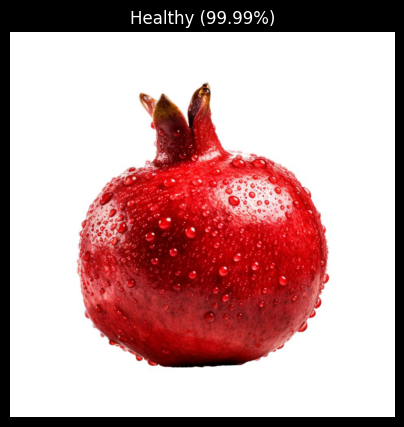

https://gardenerspath.com/wp-content/uploads/2021/10/Pomegranate-Eaten-By-a-Squirrel.jpg
 → Predicted: Bacterial_Blight
 → Confidence: 100.00%



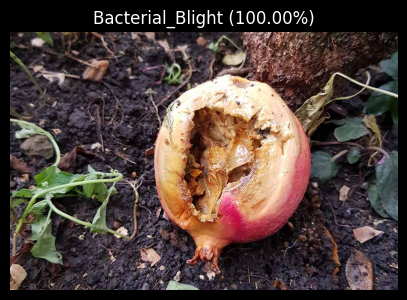

https://content.peat-cloud.com/w400/anthracnose-of-pomegranate-pomegranate-1665753930.jpg
 → Predicted: Anthracnose
 → Confidence: 99.80%



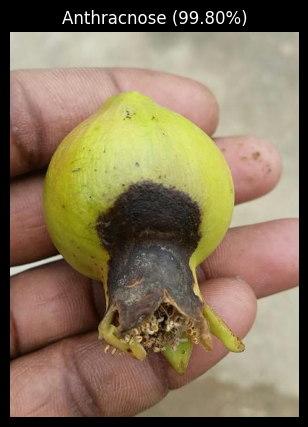

In [116]:
for path, (label, confidence) in zip(image_paths, results):

    if str(path).startswith("http://") or str(path).startswith("https://"):
        tmp_path = "/kaggle/working/temp_display.jpg"
        urllib.request.urlretrieve(path, tmp_path)
        img_path = tmp_path
    else:
        img_path = path

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    print(f"{path}\n → Predicted: {label}\n → Confidence: {confidence:.2f}%\n")

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{label} ({confidence:.2f}%)")
    plt.show()